In [1]:
import cv2
import tensorflow as tf
from tensorflow.keras.layers import Input,Conv2D,ReLU,BatchNormalization,LeakyReLU
import numpy as np
import matplotlib.pyplot as plt
import rasterio as rs
from rasterio import plot

In [15]:
def normalize(img,minimum=0,maximum=1):
    img_max = np.max(img)
    img_min = np.min(img)
    return (img-img_min)/np.abs(img_max-img_min)*(maximum-minimum)+minimum

def speckle_noise(img,var=.05,seed=42,min_val=0,max_val=1):
    normalized_img = normalize(img)
    upper_band = (12*var)**.5
    np.random.seed(seed)
    noise = np.random.uniform(-upper_band/2,upper_band/2,size=img.shape)
    noisy_img = normalized_img*(1+noise)
    noisy_img = np.clip(noisy_img,0,1)
    ret_val = normalize(noisy_img,minimum=min_val,maximum=max_val)
    return ret_val
    
    

In [16]:
def create_model(input_shape=(256,256,1)):
    input_layer=Input(shape=input_shape)
    x=Conv2D(filters=64,kernel_size=(3,3),padding='same')(input_layer)
    x=LeakyReLU(.2)(x)
    for i in range(1,5):
        x=Conv2D(filters=64,kernel_size=(3,3),dilation_rate=i,padding='same',)(x)
        x=BatchNormalization()(x)
        x=LeakyReLU(.2)(x)
    for i in range(4,0,-1):
        x=Conv2D(filters=64,kernel_size=(3,3),dilation_rate=i,padding='same')(x)
        x=BatchNormalization()(x)
        x=ReLU()(x)
    x=Conv2D(filters=1,kernel_size=(3,3),padding='same')(x)
    x=ReLU()(x) 
    x= tf.math.multiply(input_layer,x)
    x=tf.math.tanh(x)
    return tf.keras.Model(inputs=input_layer,outputs=x)



In [17]:
model=create_model([500,500,1])
model.load_weights('D:\ANN\saved_model_14000912.h5')

In [18]:

def denoise(network,img,tr,verbose=False):
    if len(img.shape)<3:
        img = np.expand_dims(img,axis=[0,-1])
    if len(img.shape)<4:
        img = np.expand_dims(img,axis=[0])
    if img.max()>1:
        img_tensor = tf.constant(img/255)
    else:
        img_tensor = tf.constant(img)
    despeckeled = model(img_tensor)
    
    return normalize(despeckeled.numpy(),maximum=255).squeeze()


In [19]:
tr = .3
var = .75
shape = (500,500)
img1 = cv2.imread('img1.png')
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2GRAY)
img2 = cv2.imread('img23.png',0)/255
# img3 = cv2.imread('img23.o')
# img3 = img3/50
# img3 = normalize(img3)
# img4 = cv2.imread('reeses_puffs.png',0)[:]
# img4 = speckle_noise(img4,var=var,seed=42,min_val=0,max_val=1)

imgs = [img1,img2]
imgs = [cv2.resize(img,shape)[:,:,np.newaxis] for img in imgs ]
despeckled_imgs = [denoise(model,img,tr,verbose=False) for img in imgs]

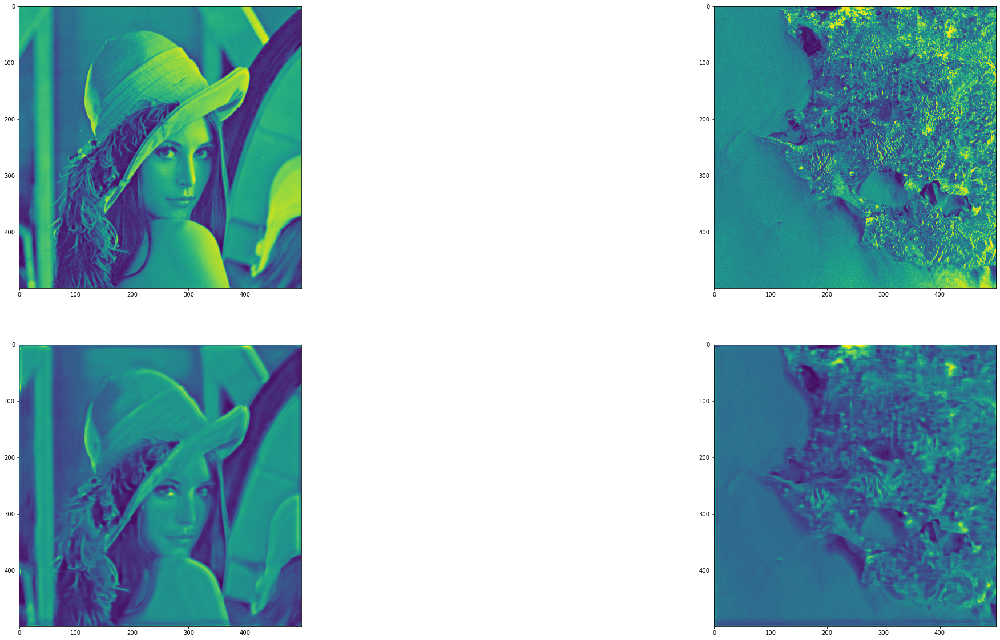

In [20]:
fig,ax = plt.subplots(2,2,figsize=(40,20))
for i in range(2):
    ax[0,i].imshow(imgs[i])
    ax[1,i].imshow(despeckled_imgs[i])    

In [21]:
tr = .03
var = .5
shape = (500,500)
img1 = cv2.imread('img6.png',0)/255
img2 = cv2.imread('img7.png',0)/255
# img3 = cv2.imread('img23.o')
# img3 = img3/50
# img3 = normalize(img3)
# img4 = cv2.imread('reeses_puffs.png',0)[:]
# img4 = speckle_noise(img4,var=var,seed=42,min_val=0,max_val=1)

imgs = [img1,img2]
imgs = [cv2.resize(img,shape)[:,:,np.newaxis] for img in imgs ]
despeckled_imgs = [denoise(model,img,tr,verbose=False) for img in imgs]

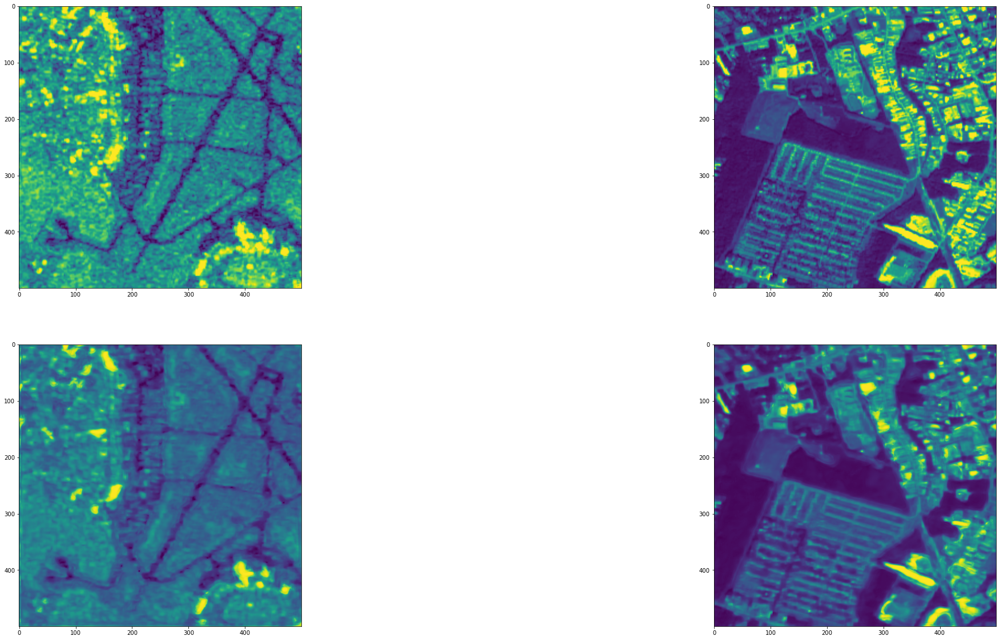

In [22]:
fig,ax = plt.subplots(2,2,figsize=(40,20))
for i in range(2):
    ax[0,i].imshow(imgs[i])
    ax[1,i].imshow(despeckled_imgs[i])    

In [23]:
# fig.savefig('example.jpg')

In [24]:
tr = .03
var = .5
shape = (500,500)
img1 = cv2.imread('img8.png',0)/255
img2 = cv2.imread('img9.png',0)/255
# img3 = cv2.imread('img23.o')
# img3 = img3/50
# img3 = normalize(img3)
# img4 = cv2.imread('reeses_puffs.png',0)[:]
# img4 = speckle_noise(img4,var=var,seed=42,min_val=0,max_val=1)

imgs = [img1,img2]
imgs = [cv2.resize(img,shape)[:,:,np.newaxis] for img in imgs ]
despeckled_imgs = [denoise(model,img,tr,verbose=False) for img in imgs]

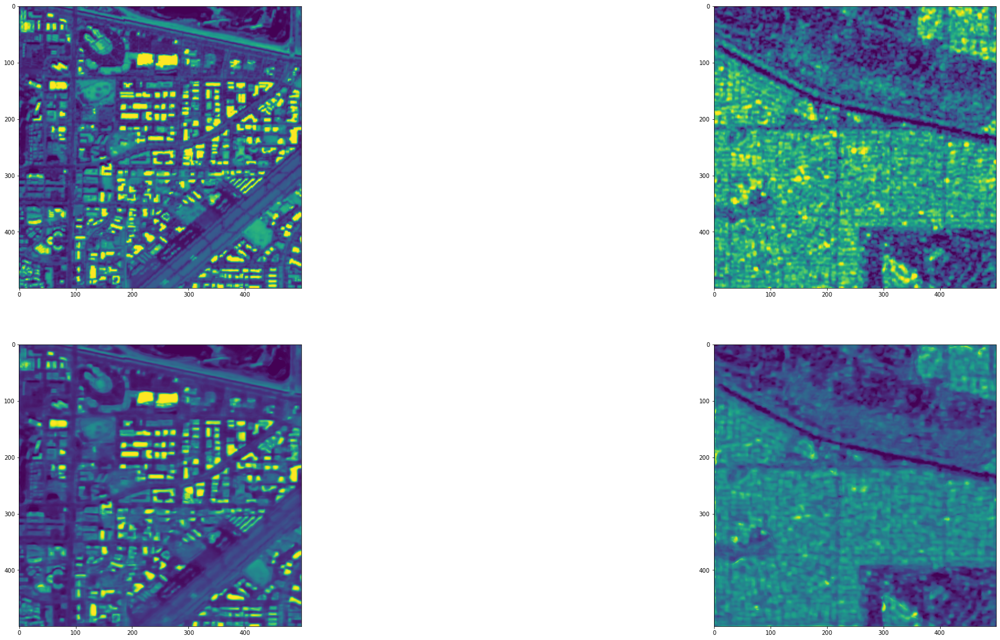

In [25]:
fig,ax = plt.subplots(2,2,figsize=(40,20))
for i in range(2):
    ax[0,i].imshow(imgs[i])
    ax[1,i].imshow(despeckled_imgs[i])  

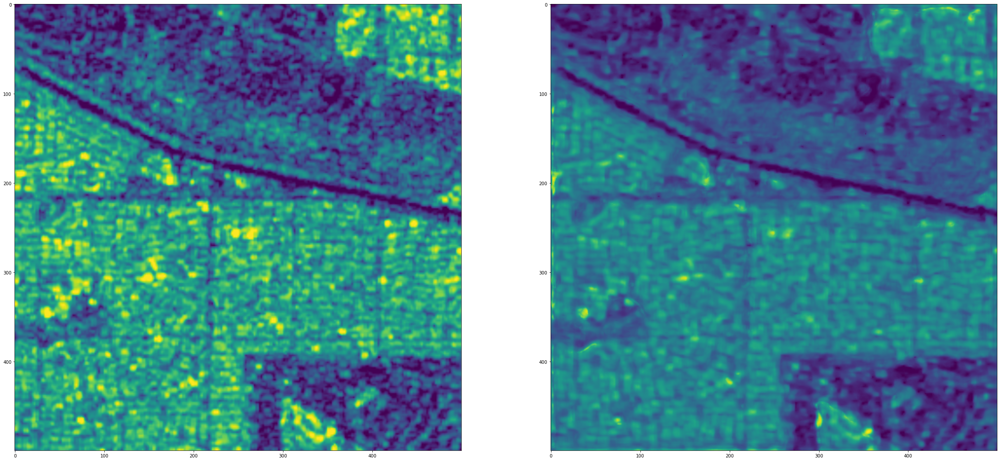

In [26]:
fig, ax =plt.subplots(1,2,figsize=(40,20))
ax[0].imshow(imgs[1])
ax[1].imshow(despeckled_imgs[1])

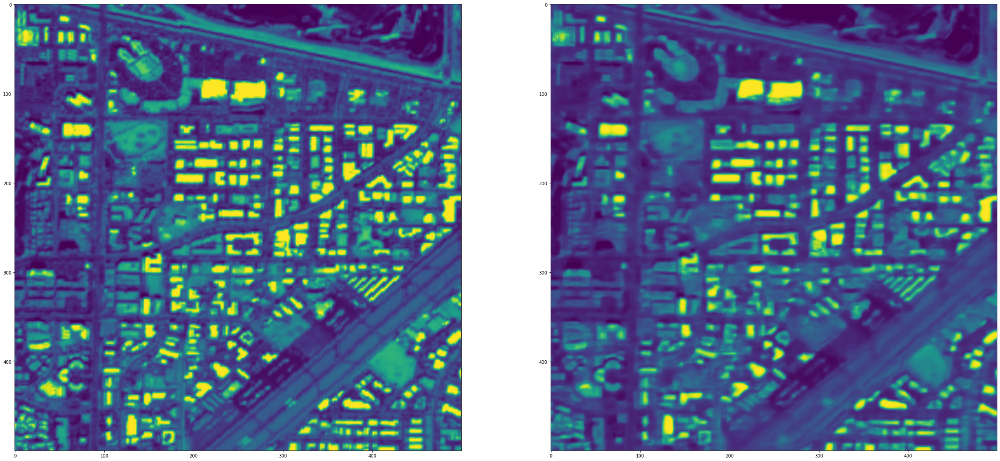

In [27]:
fig, ax =plt.subplots(1,2,figsize=(40,20))
ax[0].imshow(imgs[0])
ax[1].imshow(despeckled_imgs[0])